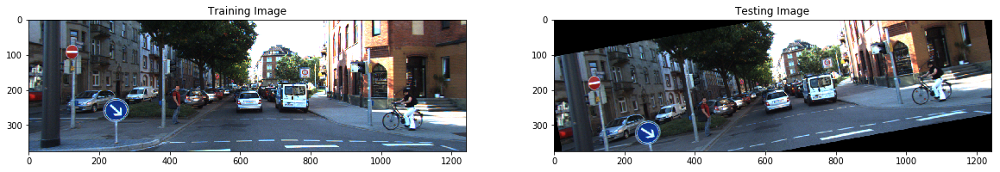

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
%matplotlib inline

# Load the image
image1 = cv2.imread('01.png')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_RGB2GRAY)

# Create test image by adding Scale Invariance and Rotational Invariance
test_image = training_image

num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 10, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

# Display traning image and testing image
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(training_image)

plots[1].set_title("Testing Image")
plots[1].imshow(test_image)

# SIFT


Mean number of keypoints detected:  3160.5


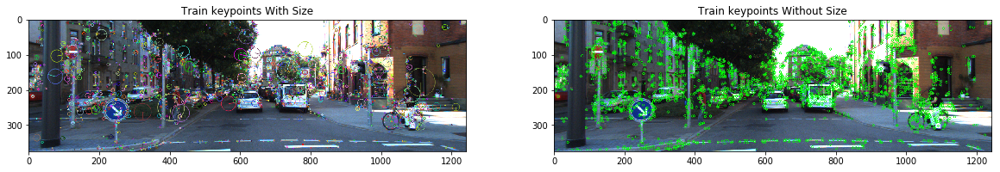

In [43]:
sift = cv2.xfeatures2d.SIFT_create()

train_keypoints_sift, train_descriptor_sift = sift.detectAndCompute(training_gray, None)
test_keypoints_sift, test_descriptor_sift = sift.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(training_image)
keypoints_with_size = np.copy(training_image)

cv2.drawKeypoints(training_image, train_keypoints_sift, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(training_image, train_keypoints_sift, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the mean number of keypoints detected in both the images
print("Mean number of keypoints detected: ", (len(train_keypoints_sift)+len(test_keypoints_sift))/2)

# BFF for SIFT

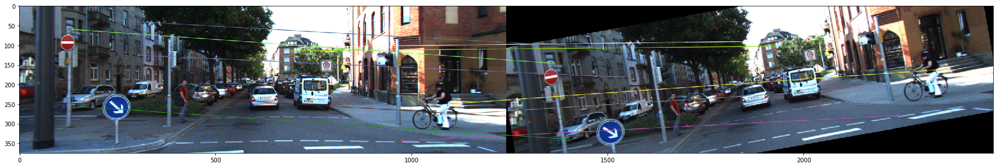

BF Matcher number of matches for SIFT =  3227
BF Matcher number of good matches for SIFT =  2026


In [44]:
# BFMatcher with default params
bf_sift = cv2.BFMatcher()
matches_bff_sift = bf_sift.knnMatch(train_descriptor_sift, test_descriptor_sift,k=2)
# Apply ratio test
good_bff_sift = []
for m,n in matches_bff_sift:
    if m.distance < 0.75*n.distance:
        good_bff_sift.append(m)

#Displaying top 10 matches
good_bff_sift = sorted(good_bff_sift, key = lambda x : x.distance)

sift_result = cv2.drawMatches(training_image,train_keypoints_sift,test_image,test_keypoints_sift,good_bff_sift[:10],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(30,20))
plt.imshow(result),plt.show()

print("BF Matcher number of matches for SIFT = ",len(matches_bff_sift))
print("BF Matcher number of good matches for SIFT = ",len(good_bff_sift))

# FLANN for SIFT

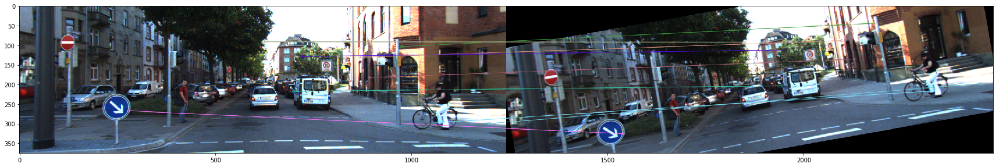

Flann Matcher number of matches for SIFT =  3227
Flann Matcher number of good matches for SIFT =  2026


In [47]:
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # or pass empty dictionary

flann_sift = cv2.FlannBasedMatcher(index_params,search_params)

matches_flann_sift = flann_sift.knnMatch(train_descriptor_sift,test_descriptor_sift,k=2)

good_flann_sift = []
for m,n in matches_flann_sift:
    if m.distance < 0.75*n.distance:
        good_flann_sift.append(m)

#Displaying top 10 matches
good_flann_sift = sorted(good_flann_sift, key = lambda x : x.distance)

img3 = cv2.drawMatches(training_image,train_keypoints_sift,test_image,test_keypoints_sift,good_flann_sift[:10],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(30,20))
plt.imshow(img3),plt.show()
print("Flann Matcher number of matches for SIFT = ",len(matches_flann_sift))
print("Flann Matcher number of good matches for SIFT = ",len(good_flann_sift))

# SURF

Mean number of keypoints detected:  3562.0


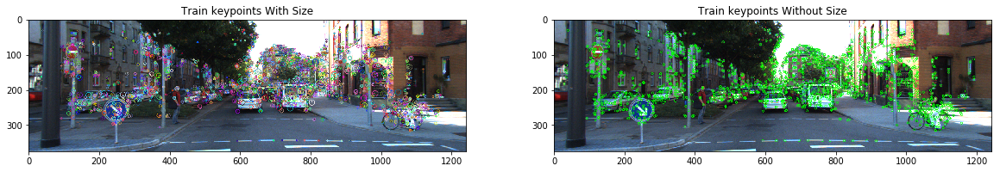

In [48]:
surf = cv2.xfeatures2d.SURF_create()

train_keypoints_surf, train_descriptor_surf = surf.detectAndCompute(training_gray, None)
test_keypoints_surf, test_descriptor_surf = surf.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(training_image)
keypoints_with_size = np.copy(training_image)

cv2.drawKeypoints(training_image, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(training_image, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the mean number of keypoints detected in both the images
print("Mean number of keypoints detected: ", (len(train_keypoints_surf)+len(test_keypoints_surf))/2)

# BFF for SURF

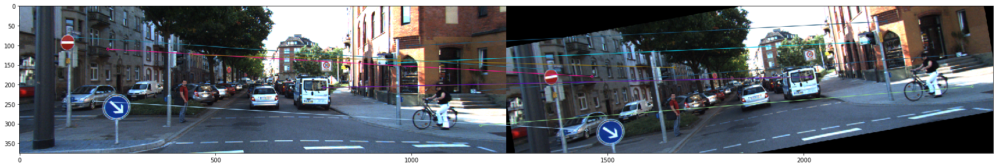

BF Matcher number of matches for SURF=  3579
BF Matcher number of good matches for SURF=  1692


In [49]:
# BFMatcher with default params
bf_surf = cv2.BFMatcher()
matches_bff_surf = bf_surf.knnMatch(train_descriptor_surf, test_descriptor_surf,k=2)
# Apply ratio test
good_bff_surf = []
for m,n in matches_bff_surf:
    if m.distance < 0.75*n.distance:
        good_bff_surf.append(m)

#Displaying top 10 matches
good_bff_surf = sorted(good_bff_surf, key = lambda x : x.distance)

img3 = cv2.drawMatches(training_image,train_keypoints_surf,test_image,test_keypoints_surf,good_bff_surf[:10],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(30,20))
plt.imshow(img3),plt.show()

print("BF Matcher number of matches for SURF= ",len(matches_bff_surf))
print("BF Matcher number of good matches for SURF= ",len(good_bff_surf))

# FLANN for SURF

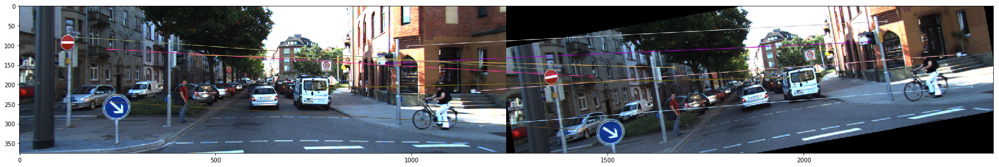

Flann Matcher number of matches for SURF =  3579
Flann Matcher number of good matches for SURF =  1692


In [50]:
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # or pass empty dictionary

flann_surf = cv2.FlannBasedMatcher(index_params,search_params)

matches_flann_surf = flann_surf.knnMatch(train_descriptor_surf,test_descriptor_surf,k=2)

good_flann_surf = []
for m,n in matches_flann_surf:
    if m.distance < 0.75*n.distance:
        good_flann_surf.append(m)

#Displaying top 10 matches
good_flann_surf = sorted(good_flann_surf, key = lambda x : x.distance)

img3 = cv2.drawMatches(training_image,train_keypoints_surf,test_image,test_keypoints_surf,good_flann_surf[:10],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(30,20))
plt.imshow(img3),plt.show()
print("Flann Matcher number of matches for SURF = ",len(matches_flann_surf))
print("Flann Matcher number of good matches for SURF = ",len(good_flann_surf))

# ORB

Mean number of keypoints detected:  500.0


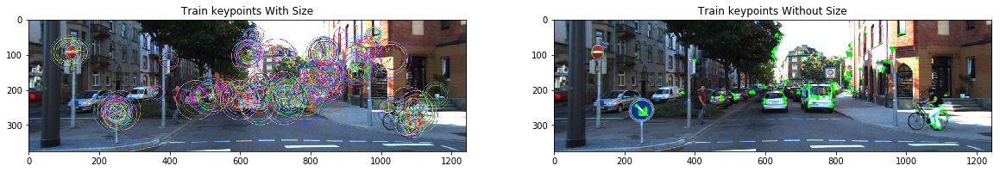

In [51]:
orb = cv2.ORB_create()

train_keypoints_orb, train_descriptor_orb = orb.detectAndCompute(training_gray, None)
test_keypoints_orb, test_descriptor_orb = orb.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(training_image)
keypoints_with_size = np.copy(training_image)

cv2.drawKeypoints(training_image, train_keypoints_orb, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(training_image, train_keypoints_orb, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the mean number of keypoints detected in both the images
print("Mean number of keypoints detected: ", (len(train_keypoints_orb)+len(test_keypoints_orb))/2)

# BFF for ORB

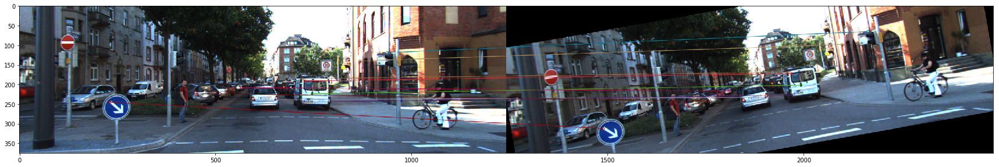

BF Matcher number of matches for ORB =  500
BF Matcher number of good matches for ORB=  341


In [52]:
# BFMatcher with default params
bf_orb = cv2.BFMatcher(cv2.NORM_HAMMING)
matches_bff_orb = bf_orb.knnMatch(train_descriptor_orb, test_descriptor_orb,k=2)
# Apply ratio test
good_bff_orb = []
for m,n in matches_bff_orb:
    if m.distance < 0.75*n.distance:
        good_bff_orb.append(m)

#Displaying top 10 matches
good_bff_orb = sorted(good_bff_orb, key = lambda x : x.distance)

img3 = cv2.drawMatches(training_image,train_keypoints_orb,test_image,test_keypoints_orb,good_bff[:10],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(30,20))
plt.imshow(img3),plt.show()
print("BF Matcher number of matches for ORB = ",len(matches_bff_orb))
print("BF Matcher number of good matches for ORB= ",len(good_bff_orb))

# FLANN for ORB

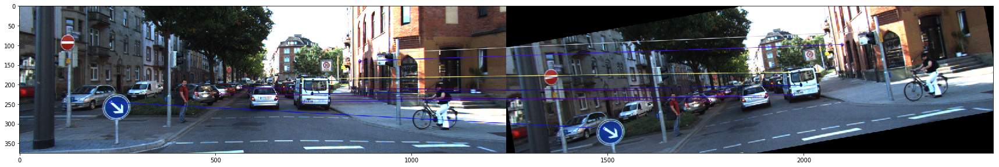

Flann Matcher number of matches for ORB =  500
Flann Matcher number of good matches for ORB =  346


In [56]:
FLANN_INDEX_KDTREE = 0
FLANN_INDEX_LSH = 6
index_params= dict(algorithm = FLANN_INDEX_LSH,
                   table_number = 6, # 12
                   key_size = 12,     # 20
                   multi_probe_level = 1) #2
search_params = dict(checks=50)   # or pass empty dictionary

flann_orb = cv2.FlannBasedMatcher(index_params,search_params)

matches_flann_orb = flann_orb.knnMatch(train_descriptor_orb,test_descriptor_orb,k=2)

good_flann_orb = []
for m,n in matches_flann_orb:
    if m.distance < 0.75*n.distance:
        good_flann_orb.append(m)

#Displaying top 10 matches
good_flann_orb = sorted(good_flann_orb, key = lambda x : x.distance)

img3 = cv2.drawMatches(training_image,train_keypoints_orb,test_image,test_keypoints_orb,good_flann_orb[:10],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(30,20))
plt.imshow(img3),plt.show()
print("Flann Matcher number of matches for ORB = ",len(matches_flann_orb))
print("Flann Matcher number of good matches for ORB = ",len(good_flann_orb))

# AKAZE

Mean number of keypoints detected:  1980.5


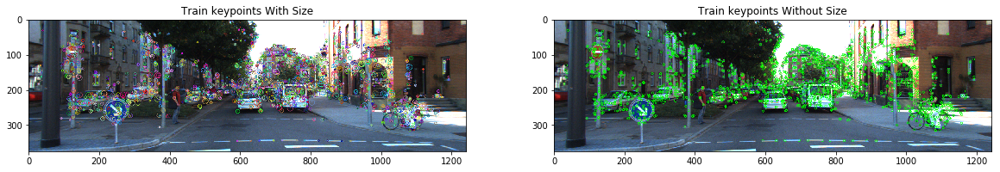

In [57]:
akaze = cv2.AKAZE_create()

train_keypoints_akase, train_descriptor_akase = akaze.detectAndCompute(training_gray, None)
test_keypoints_akase, test_descriptor_akase = akaze.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(training_image)
keypoints_with_size = np.copy(training_image)

cv2.drawKeypoints(training_image, train_keypoints_akase, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(training_image, train_keypoints_akase, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the mean number of keypoints detected in both the images
print("Mean number of keypoints detected: ", (len(train_keypoints_akase)+len(test_keypoints_akase))/2)

# BFF for AKASE

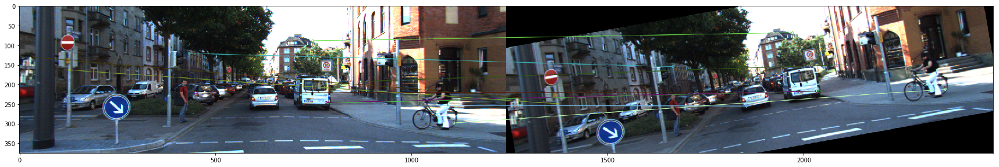

BFF Matcher number of matches for AKASE =  2047
BFF Matcher number of good matches for AKASE =  1535


In [58]:
bf_akase = cv2.BFMatcher(cv2.NORM_HAMMING)
matches_bff_akase = bf_akase.knnMatch(train_descriptor_akase, test_descriptor_akase,k=2)
# Apply ratio test
good_bff_akase = []
for m,n in matches_bff_akase:
    if m.distance < 0.75*n.distance:
        good_bff_akase.append(m)

#Displaying top 10 matches
good_bff_akase = sorted(good_bff_akase, key = lambda x : x.distance)

img3 = cv2.drawMatches(training_image,train_keypoints_akase,test_image,test_keypoints_akase,good_bff_akase[:10],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(30,20))
plt.imshow(img3),plt.show()
print("BFF Matcher number of matches for AKASE = ",len(matches_bff_akase))
print("BFF Matcher number of good matches for AKASE = ",len(good_bff_akase))

# FLANN for AKASE

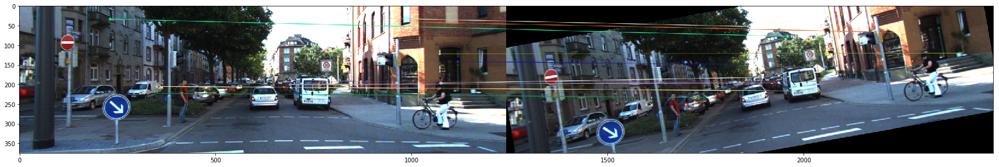

Flann Matcher number of matches for AKASE =  2047
Flann Matcher number of good matches for AKASE =  1541


In [59]:
FLANN_INDEX_KDTREE = 0
FLANN_INDEX_LSH = 6
index_params= dict(algorithm = FLANN_INDEX_LSH,
                   table_number = 6, # 12
                   key_size = 12,     # 20
                   multi_probe_level = 1) #2
search_params = dict(checks=50)   # or pass empty dictionary

flann_akase = cv2.FlannBasedMatcher(index_params,search_params)

matches_flann_akase = flann_akase.knnMatch(train_descriptor_akase,test_descriptor_akase,k=2)

good_flann_akase = []
for m,n in matches_flann_akase:
    if m.distance < 0.75*n.distance:
        good_flann_akase.append(m)

#Displaying top 10 matches
good_flann_akase = sorted(good_flann_akase, key = lambda x : x.distance)

img3 = cv2.drawMatches(training_image,train_keypoints_akase,test_image,test_keypoints_akase,good_flann_orb[:10],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(30,20))
plt.imshow(img3),plt.show()
print("Flann Matcher number of matches for AKASE = ",len(matches_flann_akase))
print("Flann Matcher number of good matches for AKASE = ",len(good_flann_akase))